In [3]:
# First we import the libraries for this lesson

import pandas as pd
import numpy as np

from warnings import filterwarnings

filterwarnings(action='ignore')

In [5]:
flights = pd.read_csv('flights.csv')
flights.head()

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,dest,air_time,distance,hour,minute,time_hour
0,2023,1,1,1.0,2038,203.0,328.0,3,205.0,UA,628,N25201,EWR,SMF,367.0,2500.0,20.0,38.0,2023-01-01 20:00:00
1,2023,1,1,18.0,2300,78.0,228.0,135,53.0,DL,393,N830DN,JFK,ATL,108.0,760.0,23.0,0.0,2023-01-01 23:00:00
2,2023,1,1,31.0,2344,47.0,500.0,426,34.0,B6,371,N807JB,JFK,BQN,190.0,1576.0,23.0,44.0,2023-01-01 23:00:00
3,2023,1,1,33.0,2140,173.0,238.0,2352,166.0,B6,1053,N265JB,JFK,CHS,108.0,636.0,21.0,40.0,2023-01-01 21:00:00
4,2023,1,1,36.0,2048,228.0,223.0,2252,211.0,UA,219,N17730,EWR,DTW,80.0,488.0,20.0,48.0,2023-01-01 20:00:00


In [7]:
planes = pd.read_csv('planes.csv')
planes.head()

,tailnum,year,type,manufacturer,model,engines,seats,speed,engine
0,N101DQ,2020.0,Fixed wing multi engine,AIRBUS,A321-211,2,199,0,Turbo-fan
1,N101DU,2018.0,Fixed wing multi engine,C SERIES AIRCRAFT LTD PTNRSP,BD-500-1A10,2,133,0,Turbo-fan
2,N101HQ,2007.0,Fixed wing multi engine,EMBRAER-EMPRESA BRASILEIRA DE,ERJ 170-200 LR,2,80,0,Turbo-fan
3,N101NN,2013.0,Fixed wing multi engine,AIRBUS INDUSTRIE,A321-231,2,379,0,Turbo-fan
4,N102DN,2020.0,Fixed wing multi engine,AIRBUS,A321-211,2,199,0,Turbo-fan


In [9]:
flights2 = flights[["dest", "origin", "dep_delay",
                    "arr_delay", "distance", "tailnum"]]

planes2 = planes[["tailnum", "type", "engines"]]

In [11]:
# A Left Join

left_joined = pd.merge(flights2,       # the "left" dataframe
                       planes2,        # the "right" dataframe
                       how='left',   # which observations to keep? Here we are specifying that we keep the "left" dataset
                       on='tailnum'  # the join key
                       )

left_joined.head()

,dest,origin,dep_delay,arr_delay,distance,tailnum,type,engines
0,SMF,EWR,203.0,205.0,2500.0,N25201,Fixed wing multi engine,2.0
1,ATL,JFK,78.0,53.0,760.0,N830DN,Fixed wing multi engine,2.0
2,BQN,JFK,47.0,34.0,1576.0,N807JB,Fixed wing multi engine,2.0
3,CHS,JFK,173.0,166.0,636.0,N265JB,Fixed wing multi engine,2.0
4,DTW,EWR,228.0,211.0,488.0,N17730,Fixed wing multi engine,2.0


In [13]:
# A Right Join

right_joined = pd.merge(flights2, planes2, how='right', on='tailnum')

right_joined.head()

,dest,origin,dep_delay,arr_delay,distance,tailnum,type,engines
0,MCO,LGA,-4.0,18.0,950.0,N101DQ,Fixed wing multi engine,2
1,ATL,LGA,17.0,-1.0,762.0,N101DQ,Fixed wing multi engine,2
2,MCO,JFK,-2.0,-29.0,944.0,N101DQ,Fixed wing multi engine,2
3,MCO,LGA,-4.0,-37.0,950.0,N101DQ,Fixed wing multi engine,2
4,ATL,LGA,-9.0,-22.0,762.0,N101DQ,Fixed wing multi engine,2


In [15]:
# flights 2 and left join have the same number of rows.

print(flights2.shape)
print(left_joined.shape)

(435352, 6)
(435352, 8)


In [17]:
# right joined and planes2 don't have the same number of rows. WHY?

print(planes2.shape)
print(right_joined.shape)

(4840, 3)
(424068, 8)


In [19]:
# An inner join keeps rows that exist in *both* tables, and throws out rows that exist in one but are missing from the other

inner_joined = pd.merge(flights2, planes2, how='inner', on='tailnum')

inner_joined.head()

,dest,origin,dep_delay,arr_delay,distance,tailnum,type,engines
0,SMF,EWR,203.0,205.0,2500.0,N25201,Fixed wing multi engine,2
1,ATL,JFK,78.0,53.0,760.0,N830DN,Fixed wing multi engine,2
2,BQN,JFK,47.0,34.0,1576.0,N807JB,Fixed wing multi engine,2
3,CHS,JFK,173.0,166.0,636.0,N265JB,Fixed wing multi engine,2
4,DTW,EWR,228.0,211.0,488.0,N17730,Fixed wing multi engine,2


In [21]:
# shape of inner join

inner_joined.shape

(424068, 8)

In [23]:
# An outer join keeps all rows.

outer_joined = pd.merge(flights2, planes2, how='outer', on='tailnum')

outer_joined.head()

,dest,origin,dep_delay,arr_delay,distance,tailnum,type,engines
0,VPS,EWR,3.0,12.0,988.0,190NV,NaN,NaN
1,AVL,EWR,6.0,6.0,583.0,190NV,NaN,NaN
2,AVL,EWR,-7.0,12.0,583.0,190NV,NaN,NaN
3,AVL,EWR,-9.0,-7.0,583.0,190NV,NaN,NaN
4,AVL,EWR,-8.0,-12.0,583.0,190NV,NaN,NaN


In [25]:
# shape of outer join

outer_joined.shape

(435352, 8)

In [27]:
# sort the planes dataset by manufacturer
# the inplace argument says to modify the original dataframe rather than

planes.sort_values(by = 'manufacturer', inplace=True)

# output a copy

planes.head()

,tailnum,year,type,manufacturer,model,engines,seats,speed,engine
0,N101DQ,2020.0,Fixed wing multi engine,AIRBUS,A321-211,2,199,0,Turbo-fan
2112,N507AY,2008.0,Fixed wing multi engine,AIRBUS,A321-231,2,379,0,Turbo-fan
2111,N506NK,2005.0,Fixed wing multi engine,AIRBUS,A319-132,2,179,0,Turbo-fan
2109,N506DA,2022.0,Fixed wing multi engine,AIRBUS,A321-271NX,2,246,0,Turbo-fan
2107,N505NK,2005.0,Fixed wing multi engine,AIRBUS,A319-132,2,179,0,Turbo-fan


In [29]:
# sort the planes dataset by manufacturer, descnding (i.e. Z to A)
# the inplace argument says to modify the original dataframe rather than

planes.sort_values('manufacturer', ascending=False, inplace=True)

# output a copy

planes.head()

,tailnum,year,type,manufacturer,model,engines,seats,speed,engine
210,N135NK,2006.0,Rotorcraft,EUROCOPTER DEUTSCHLAND GMBH,EC 135 P2+,2,7,0,Turbo-shaft
205,N134HQ,2008.0,Fixed wing multi engine,EMBRAER-EMPRESA BRASILEIRA DE,ERJ 170-200 LR,2,80,0,Turbo-fan
643,N224JQ,2008.0,Fixed wing multi engine,EMBRAER-EMPRESA BRASILEIRA DE,ERJ 170-200 LR,2,80,0,Turbo-fan
600,N214JQ,2008.0,Fixed wing multi engine,EMBRAER-EMPRESA BRASILEIRA DE,ERJ 170-200 LR,2,80,0,Turbo-fan
158,N126HQ,2008.0,Fixed wing multi engine,EMBRAER-EMPRESA BRASILEIRA DE,ERJ 170-200 LR,2,80,0,Turbo-fan


In [31]:
# sort the planes dataset by manufacturer, model, and year

planes.sort_values(['manufacturer', 'model', 'year'], inplace=True)

planes.head()

,tailnum,year,type,manufacturer,model,engines,seats,speed,engine
3122,N772XF,2003.0,Fixed wing multi engine,AIRBUS,A319-112,2,100,0,Turbo-fan
3154,N774XF,2003.0,Fixed wing multi engine,AIRBUS,A319-112,2,100,0,Turbo-fan
3104,N771XF,2003.0,Fixed wing multi engine,AIRBUS,A319-112,2,100,0,Turbo-fan
3136,N773XF,2003.0,Fixed wing multi engine,AIRBUS,A319-112,2,100,0,Turbo-fan
3176,N775XF,2004.0,Fixed wing multi engine,AIRBUS,A319-112,2,100,0,Turbo-fan


In [33]:
# Sorting the dataframe by index

planes.sort_index(inplace=True)

planes.head()

,tailnum,year,type,manufacturer,model,engines,seats,speed,engine
0,N101DQ,2020.0,Fixed wing multi engine,AIRBUS,A321-211,2,199,0,Turbo-fan
1,N101DU,2018.0,Fixed wing multi engine,C SERIES AIRCRAFT LTD PTNRSP,BD-500-1A10,2,133,0,Turbo-fan
2,N101HQ,2007.0,Fixed wing multi engine,EMBRAER-EMPRESA BRASILEIRA DE,ERJ 170-200 LR,2,80,0,Turbo-fan
3,N101NN,2013.0,Fixed wing multi engine,AIRBUS INDUSTRIE,A321-231,2,379,0,Turbo-fan
4,N102DN,2020.0,Fixed wing multi engine,AIRBUS,A321-211,2,199,0,Turbo-fan


In [35]:
grouped = planes.groupby('type')
grouped

In [37]:
grouped.agg(len)

,tailnum,year,manufacturer,model,engines,seats,speed,engine
type,,,,,,,,
Fixed wing multi engine,4838,4838,4838,4838,4838,4838,4838,4838
Fixed wing single engine,1,1,1,1,1,1,1,1
Rotorcraft,1,1,1,1,1,1,1,1


In [39]:
# Applying agg only on 'tailnum' column returns a pandas series

grouped['tailnum'].agg(len)

type
Fixed wing multi engine     4838
Fixed wing single engine       1
Rotorcraft                     1
Name: tailnum, dtype: int64

In [41]:
grouped.size()

type
Fixed wing multi engine     4838
Fixed wing single engine       1
Rotorcraft                     1
dtype: int64

In [43]:
def my_agg_fun(series):

    if any(series > 2):

        return "sometimes over 2"

    else:

        return "never over 2"

In [45]:
grouped[['engines', 'seats']].agg(my_agg_fun)

,engines,seats
type,,
Fixed wing multi engine,sometimes over 2,sometimes over 2
Fixed wing single engine,never over 2,sometimes over 2
Rotorcraft,never over 2,sometimes over 2


In [47]:
grouped['engines'].agg([min, max, my_agg_fun, np.mean])

,min,max,my_agg_fun,mean
type,,,,
Fixed wing multi engine,2,3,sometimes over 2,2.00062
Fixed wing single engine,1,1,never over 2,1.00000
Rotorcraft,2,2,never over 2,2.00000


In [49]:
def standardize(series):

    return (series - series.mean())/series.std()


planes['seats_std'] = grouped['seats'].transform(standardize)
planes.head()

,tailnum,year,type,manufacturer,model,engines,seats,speed,engine,seats_std
0,N101DQ,2020.0,Fixed wing multi engine,AIRBUS,A321-211,2,199,0,Turbo-fan,0.098064
1,N101DU,2018.0,Fixed wing multi engine,C SERIES AIRCRAFT LTD PTNRSP,BD-500-1A10,2,133,0,Turbo-fan,-0.614363
2,N101HQ,2007.0,Fixed wing multi engine,EMBRAER-EMPRESA BRASILEIRA DE,ERJ 170-200 LR,2,80,0,Turbo-fan,-1.186464
3,N101NN,2013.0,Fixed wing multi engine,AIRBUS INDUSTRIE,A321-231,2,379,0,Turbo-fan,2.041048
4,N102DN,2020.0,Fixed wing multi engine,AIRBUS,A321-211,2,199,0,Turbo-fan,0.098064


In [51]:
import matplotlib.pyplot as plt

In [53]:
plt.rcParams['figure.figsize'] = (8.0, 6.0)  # setting default figure size for the notebook

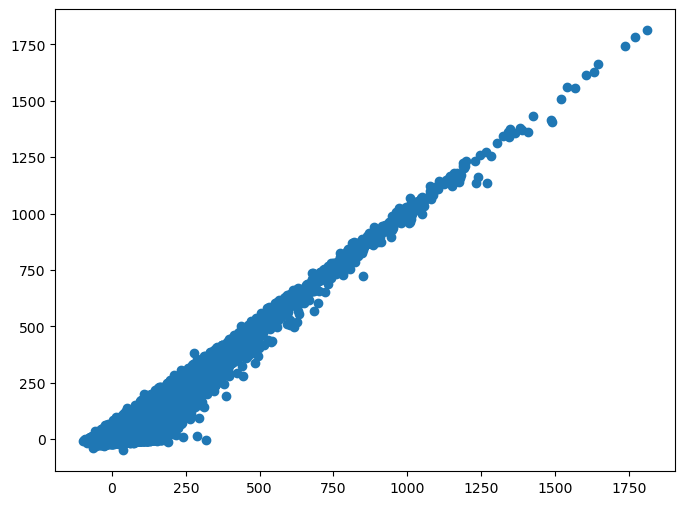

In [55]:
plt.figure()

plt.scatter(flights['arr_delay'], flights['dep_delay'])

plt.show()

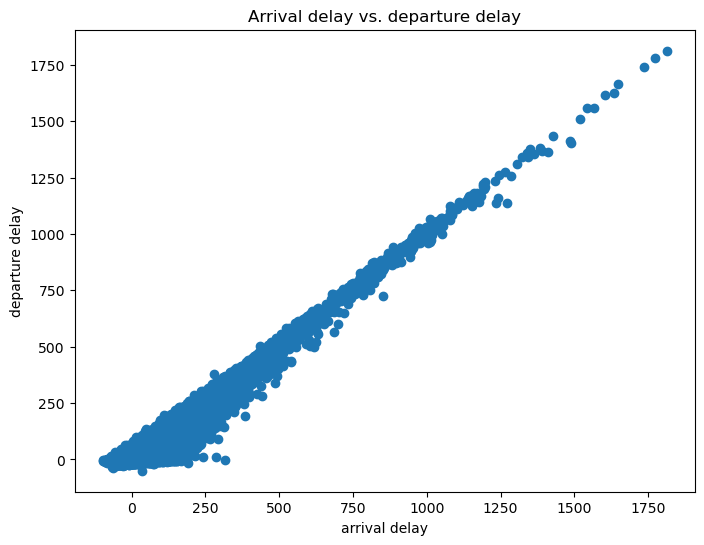

In [57]:
plt.figure()

plt.scatter(flights['arr_delay'], flights['dep_delay'])
plt.xlabel('arrival delay')
plt.ylabel('departure delay')
plt.title('Arrival delay vs. departure delay')

plt.show()

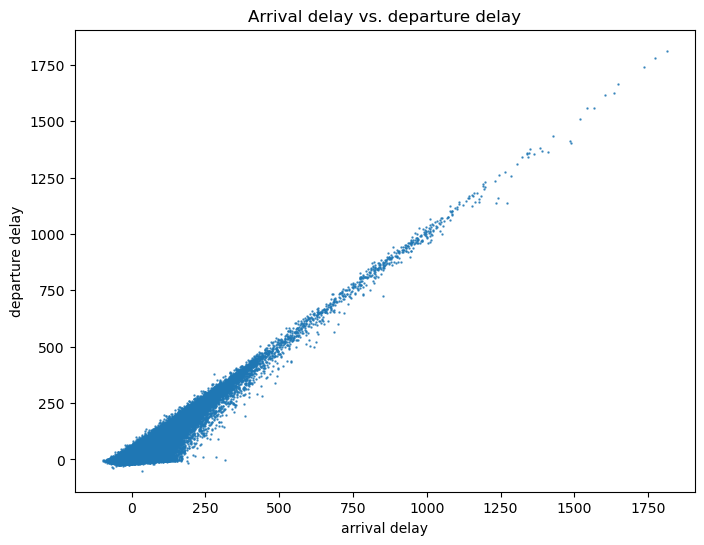

In [59]:
plt.figure()

plt.scatter(flights['arr_delay'], flights['dep_delay'],
            s=0.5, alpha=0.8)
plt.xlabel('arrival delay')
plt.ylabel('departure delay')
plt.title('Arrival delay vs. departure delay')

plt.show()

In [61]:
# Get the total number of planes from top 5 manufacturers with highest number of planes

counts = planes.groupby('manufacturer').size().sort_values(ascending=False).head(5)

counts

manufacturer
BOEING              2604
AIRBUS              1101
AIRBUS INDUSTRIE     420
EMBRAER S A          276
BOMBARDIER INC       159
dtype: int64

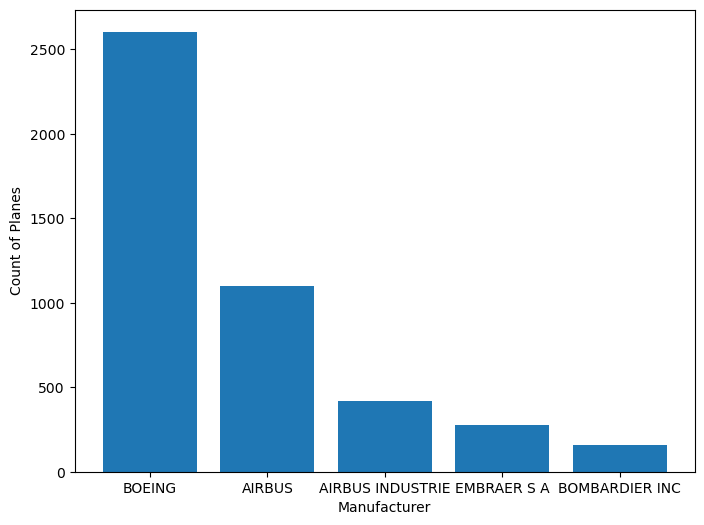

In [63]:
plt.figure()

plt.bar(counts.index, counts)

plt.xlabel('Manufacturer')
plt.ylabel('Count of Planes')
plt.show()

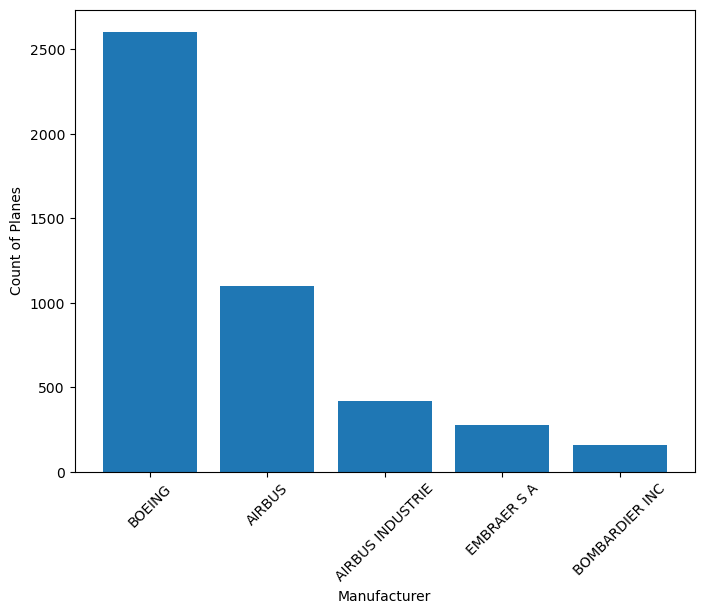

In [65]:
plt.figure()

plt.bar(counts.index, counts)

plt.xlabel('Manufacturer')
plt.ylabel('Count of Planes')

plt.xticks(rotation = 45) # This will rotate the labels by 45 degrees.
plt.show()

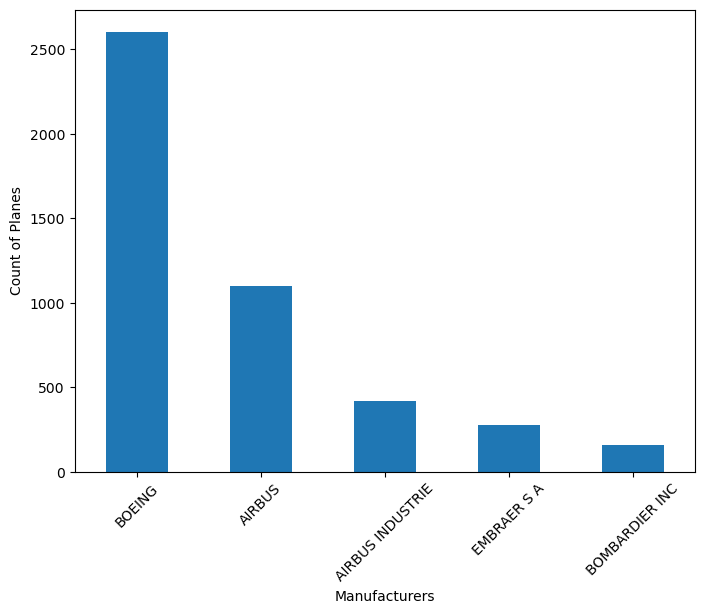

In [67]:
# The default plot is a line chart so we need to specify kind="bar" or "barh"

counts.plot(kind="bar")

plt.xlabel('Manufacturers')
plt.ylabel('Count of Planes')

plt.xticks(rotation = 45) # This will rotate the labels by 45 degrees.

plt.show()

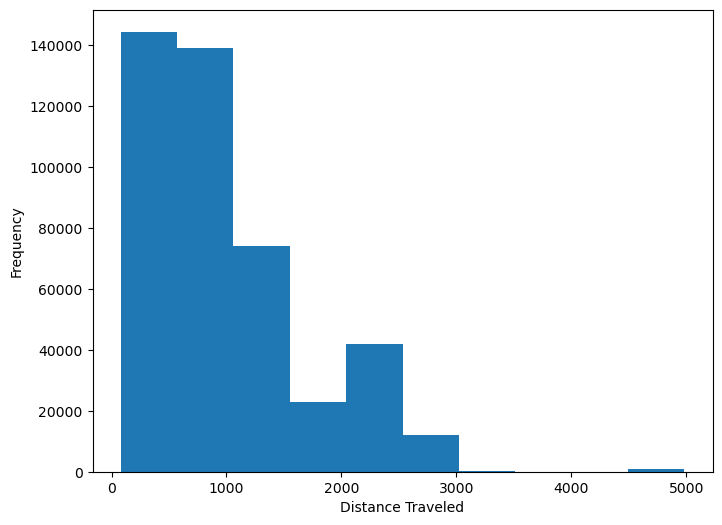

In [69]:
plt.figure()

plt.hist(flights['distance'])
plt.xlabel('Distance Traveled')
plt.ylabel('Frequency')

plt.show()

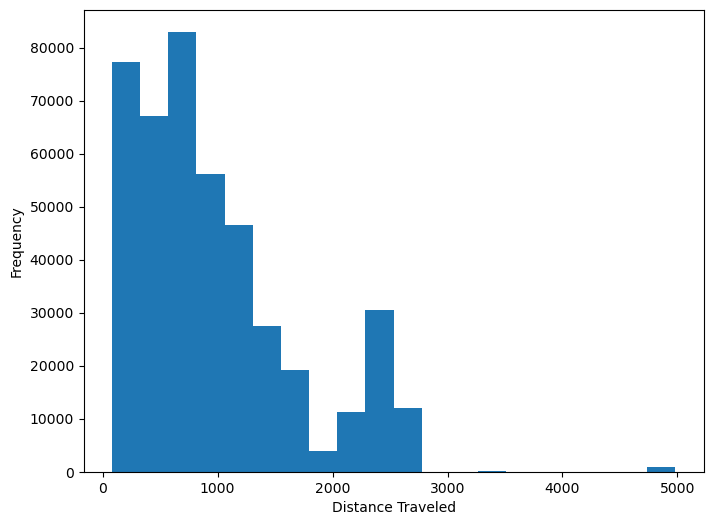

In [71]:
plt.figure()

plt.hist(flights['distance'], bins=20)
plt.xlabel('Distance Traveled')
plt.ylabel('Frequency')

plt.show()

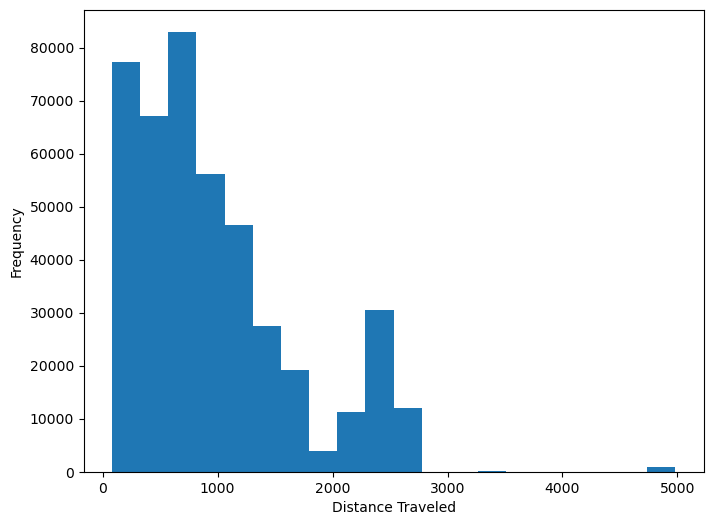

In [73]:
flights['distance'].plot(kind="hist", bins=20)

plt.xlabel('Distance Traveled')
plt.ylabel('Frequency')

plt.show()

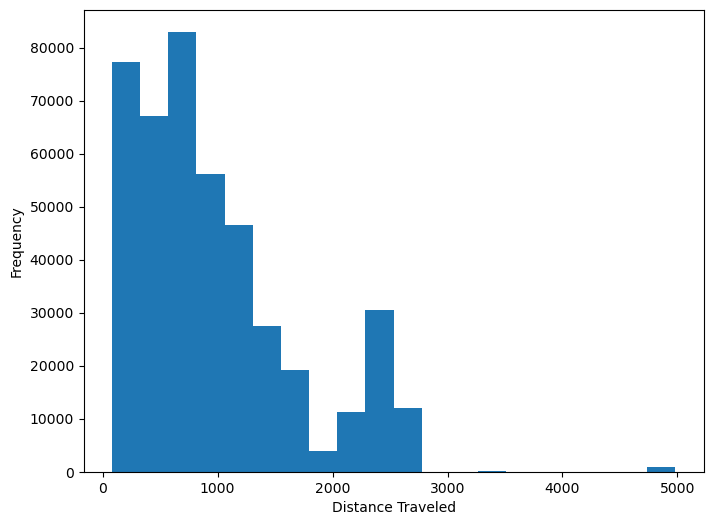

In [75]:
flights['distance'].plot(kind="hist", bins=20)

plt.xlabel('Distance Traveled')
plt.ylabel('Frequency')

plt.show()

In [79]:
monthly_counts = flights.groupby('month').size()

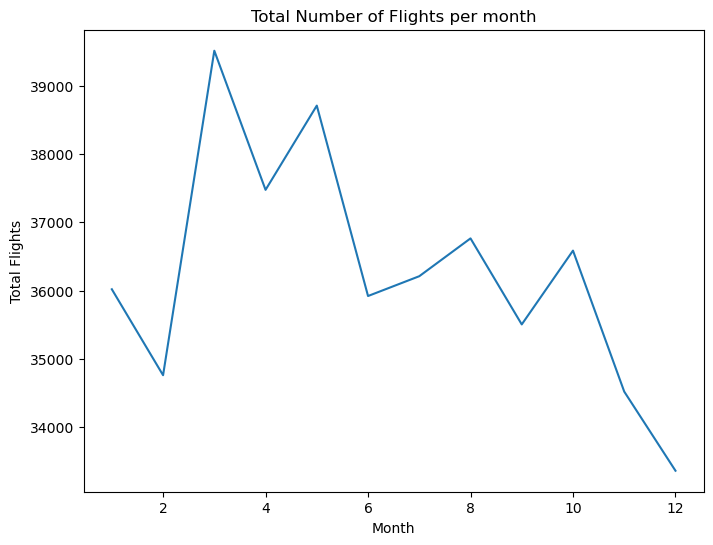

In [81]:
plt.figure()

plt.plot(monthly_counts.index, monthly_counts.values)

plt.xlabel('Month')
plt.ylabel('Total Flights')

plt.title('Total Number of Flights per month')
plt.show()

In [83]:
# monthly average delay

monthly_delay = flights.groupby('month')[['dep_delay', 'arr_delay']].agg(np.mean)

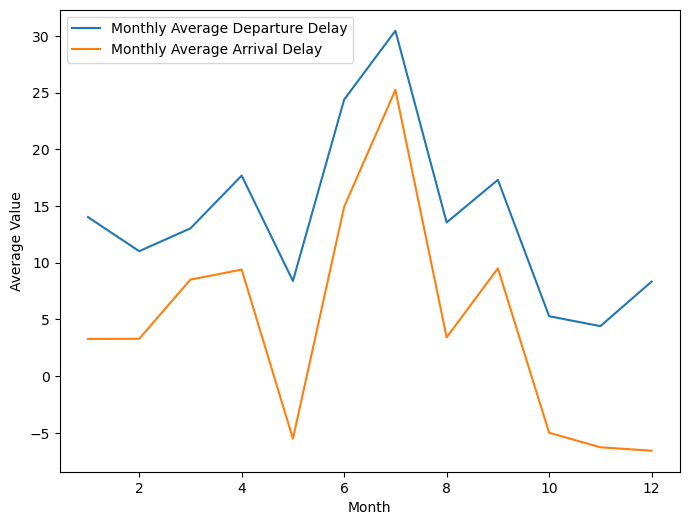

In [85]:
plt.figure()

plt.plot(monthly_delay.index, monthly_delay['dep_delay'].values, label='Monthly Average Departure Delay')
plt.plot(monthly_delay.index, monthly_delay['arr_delay'].values, label='Monthly Average Arrival Delay')


plt.xlabel('Month')
plt.ylabel('Average Value')

plt.legend()
plt.show()

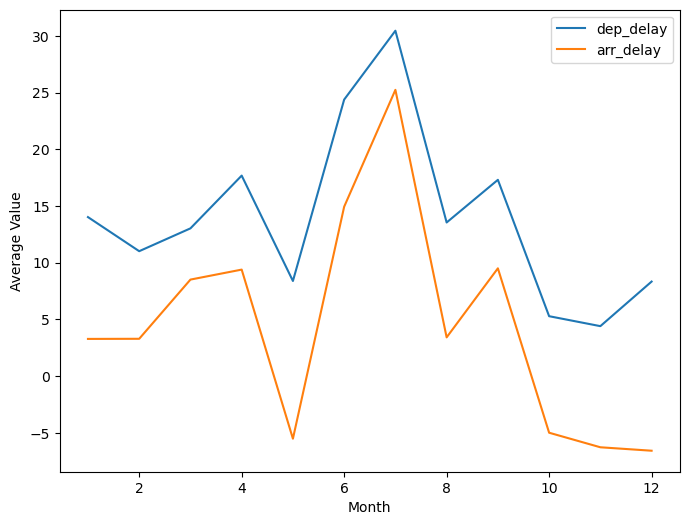

In [87]:
monthly_delay.plot()

plt.xlabel('Month')
plt.ylabel('Average Value')

plt.show()

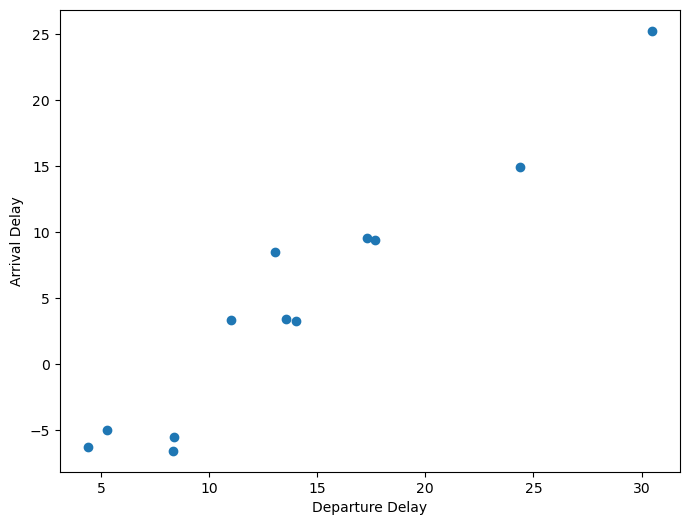

In [89]:
plt.figure()

plt.scatter(monthly_delay['dep_delay'], monthly_delay['arr_delay'])

plt.xlabel('Departure Delay')
plt.ylabel('Arrival Delay')

plt.show()

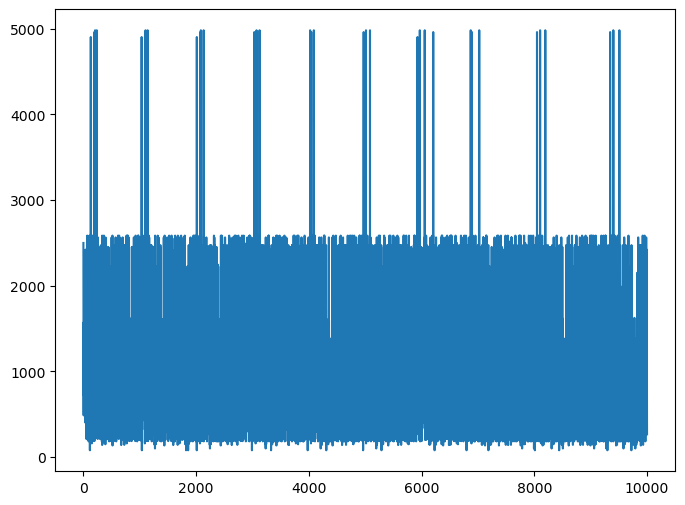

In [91]:
flights['distance'].head(10000).plot()
plt.show()

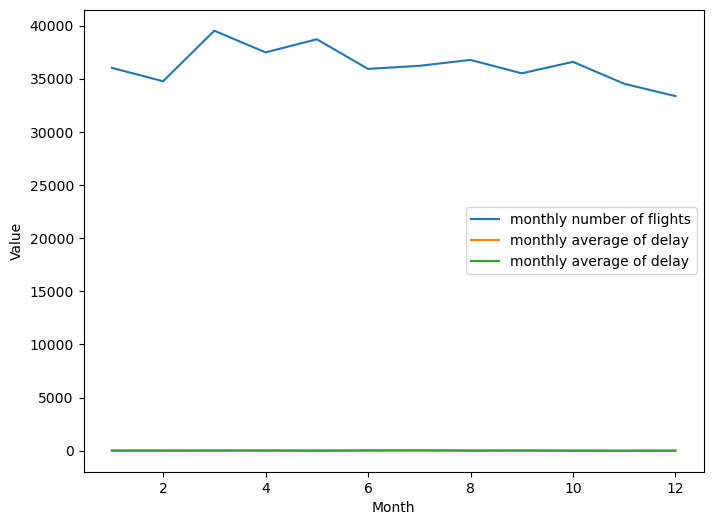

In [93]:
# Plotting monthly counts and delays in the same chart.

plt.figure()

plt.plot(monthly_counts.index, monthly_counts.values, label = 'monthly number of flights')
plt.plot(monthly_delay.index, monthly_delay.values, label = 'monthly average of delay')

plt.xlabel('Month')
plt.ylabel('Value')

plt.legend(loc = 'center right')

plt.show()

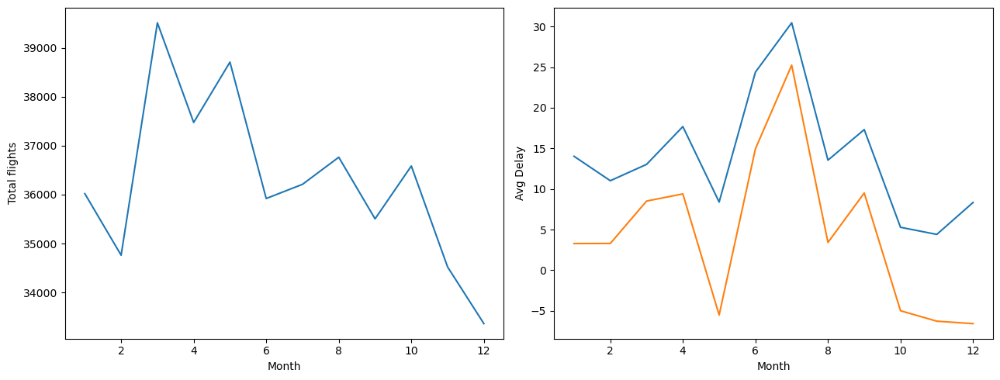

In [95]:
plt.subplots(1, 2, figsize = (13,5))

plt.subplot(1, 2, 1)
plt.plot(monthly_counts.index, monthly_counts.values)

plt.xlabel('Month')
plt.ylabel('Total flights')

plt.subplot(1, 2, 2)
plt.plot(monthly_delay.index, monthly_delay.values)

plt.xlabel('Month')
plt.ylabel('Avg Delay')

plt.tight_layout() # This adjusts the space between the charts

plt.show()

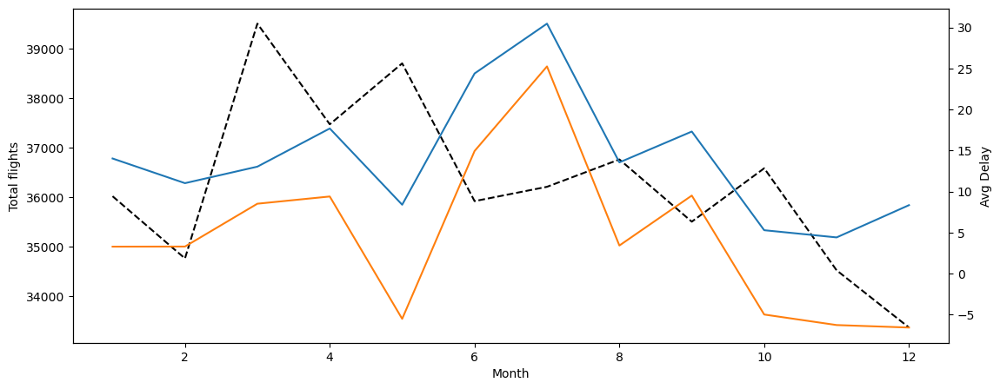

In [97]:
fig, axis = plt.subplots(figsize = (13,5))


axis.plot(monthly_counts.index, monthly_counts.values, ls = '--', lw = 1.5, c = 'black')

axis2 = axis.twinx()

axis2.plot(monthly_delay.index, monthly_delay.values, lw = 1.5)


axis.set_xlabel('Month')
axis.set_ylabel('Total flights')

axis2.set_ylabel('Avg Delay')


plt.show()

In [99]:
import seaborn as sns

sns.set_style('whitegrid') # setting the default style of plots for the notebook

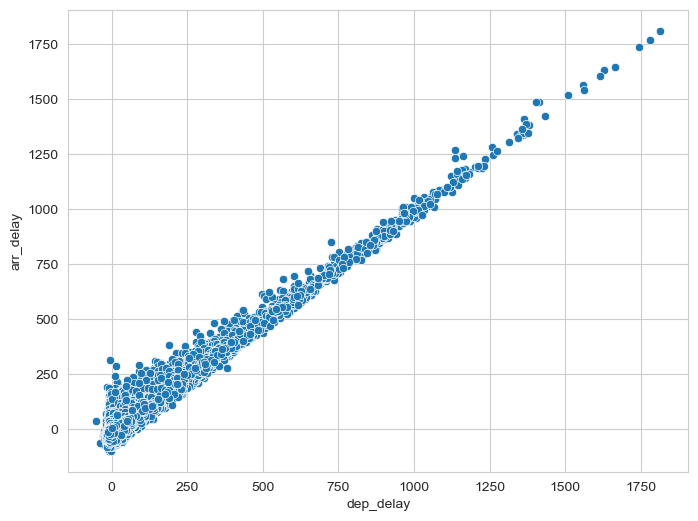

In [101]:
# Scatterplot in Seaborn

plt.figure(figsize=(8, 6))
sns.scatterplot(data=flights, x='dep_delay', y='arr_delay')

plt.show()

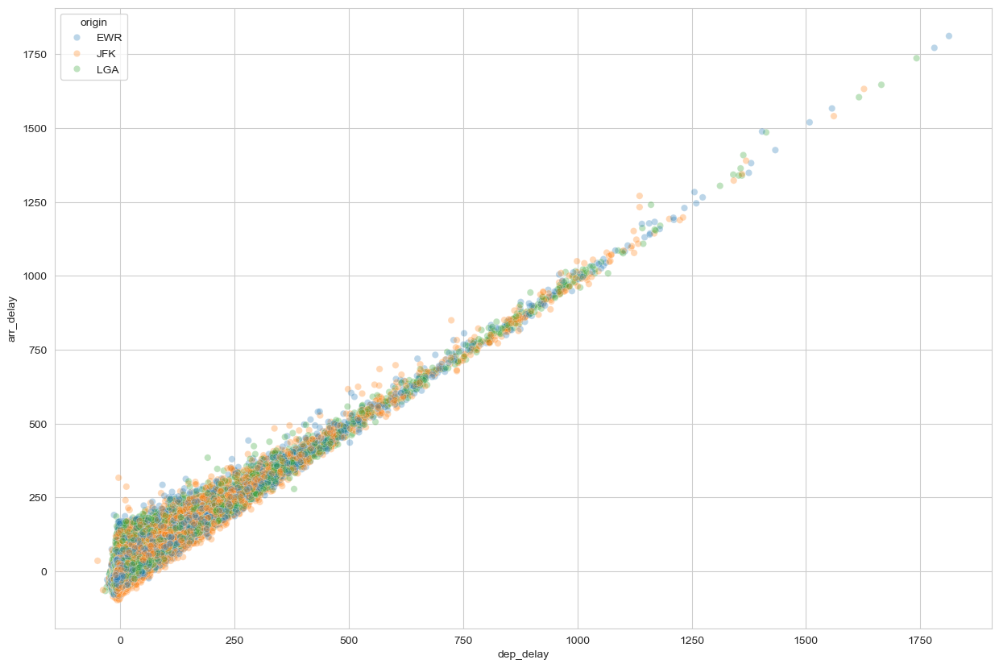

In [103]:
# lowering alpha makes points slightly more transparent

plt.figure(figsize=(15, 10))

sns.scatterplot(data=flights, x='dep_delay', y='arr_delay', hue='origin', alpha=0.3)

plt.show()

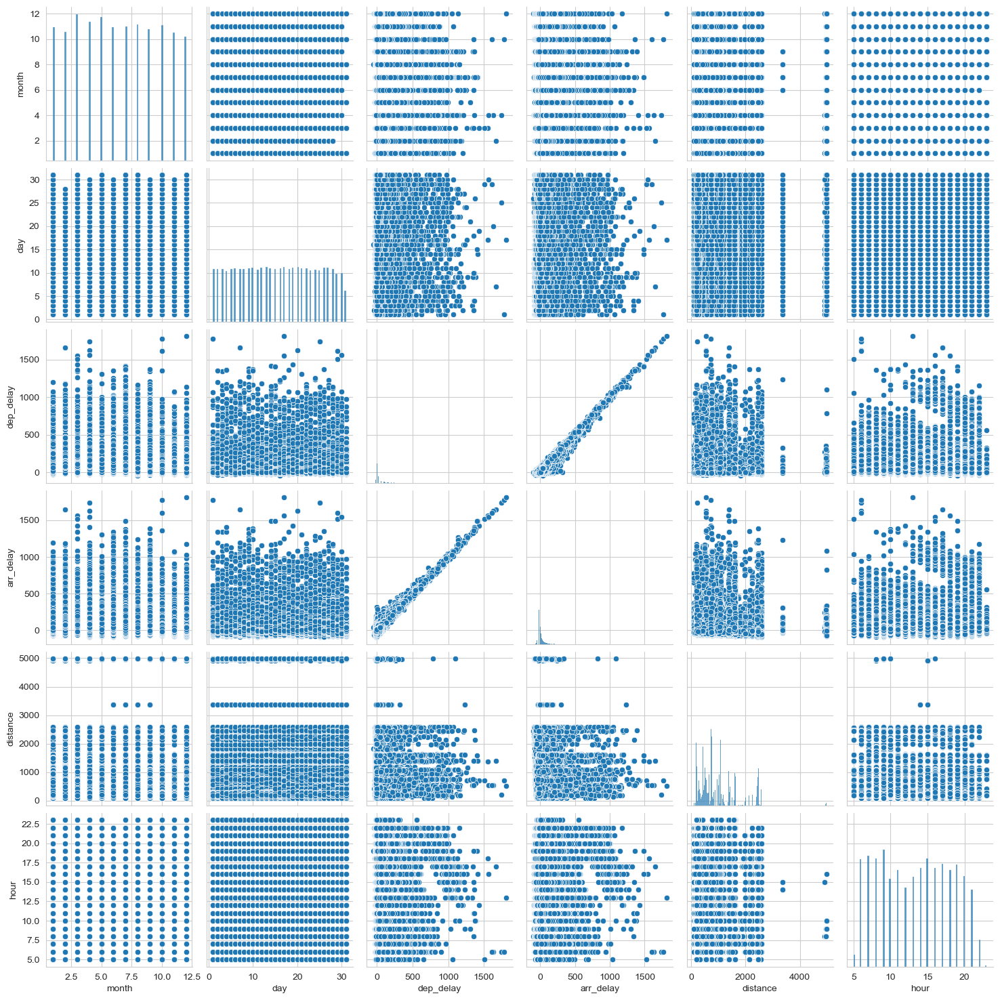

In [105]:
sns.pairplot(flights[['month', 'day',  'dep_delay', 'arr_delay','distance', 'hour']])

plt.show()

In [107]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook

output_notebook()

Loading BokehJS ...

In [113]:
df2 = pd.read_csv('goog.csv')

TOOLS = "pan,wheel_zoom,box_zoom,reset,save"

p1 = figure(title="Futures Prices", tools=TOOLS, x_axis_type='datetime')

p1.line(df2.index, df2['Open'], legend_label="Open")

p1.xaxis.axis_label = 'Index'
p1.yaxis.axis_label = 'Price'

show(p1)

In [115]:
# generate some random data

N = 4000
x = np.random.random(size=N) * 100
y = np.random.random(size=N) * 100
radii = np.random.random(size=N) * 1.5

# assign colors

colors = [
    "#%02x%02x%02x" % (int(r), int(g), 150) for r, g in zip(50+2*x, 30+2*y)
]

# specify tools are shown in the visual
TOOLS = "hover,crosshair,pan,wheel_zoom,zoom_in,zoom_out,box_zoom,undo,redo,reset,tap,save,box_select,poly_select,lasso_select,"

p = figure(tools=TOOLS)

p.scatter(x, y, radius=radii,
          fill_color=colors, fill_alpha=0.6,
          line_color=None)

show(p)

In [117]:
# importing plotly express

import plotly.express as px

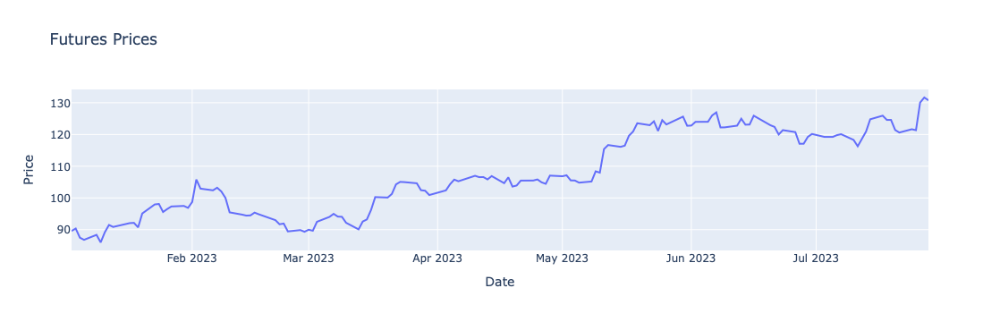

In [119]:
fig = px.line(data_frame=df2, x = 'Date', y = 'Open', title="Futures Prices")

fig.update_layout(

    xaxis_title='Date',
    yaxis_title='Price'

)

fig.show()

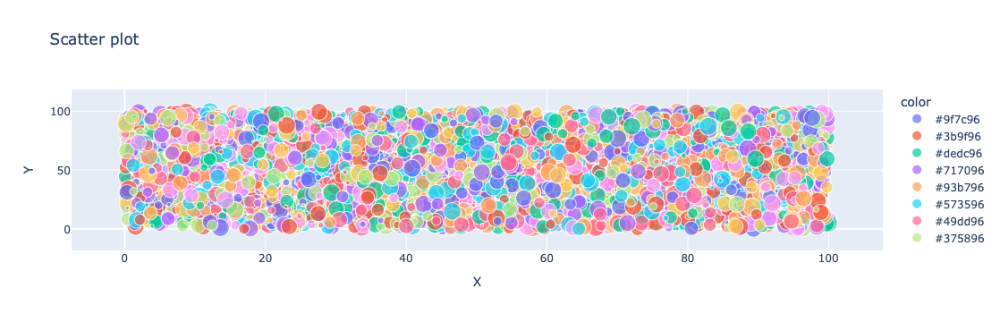

In [121]:
fig = px.scatter(x = x, y = y, title="Scatter plot", size=radii, color = colors)

fig.update_layout(

    xaxis_title='X',
    yaxis_title='Y'

)

fig.show()